# Сегментация изображений по цветам

In [1]:
import numpy as np
import os
from PIL import Image, ImageDraw

current_dir = os.path.abspath('')
parent_dir = os.path.dirname(current_dir)

Загружаем фотографию для обработки

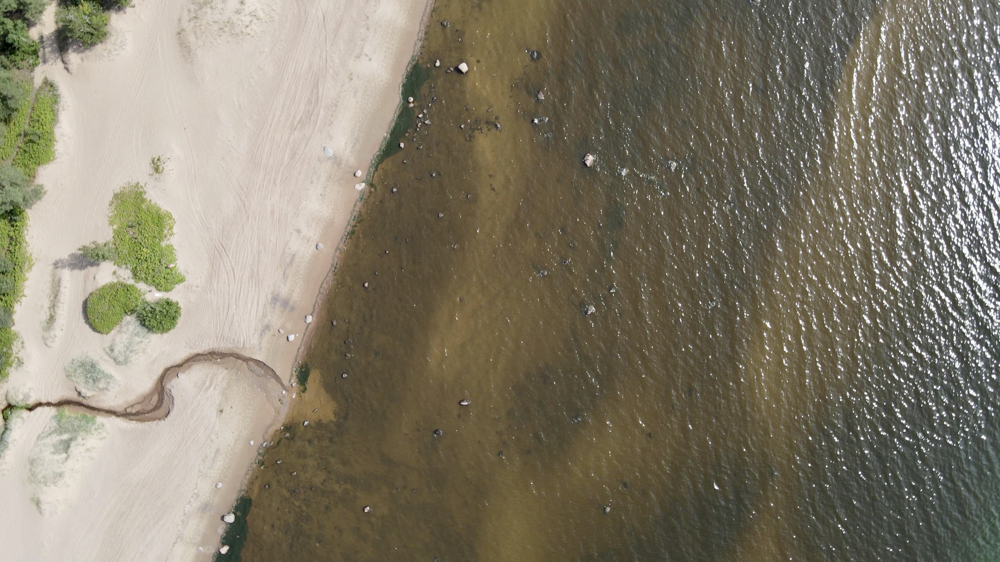

In [2]:
img_path = os.path.join(parent_dir, 'images','for_02_image_processing_notebook','beach.jpg')
image = Image.open(img_path)  # открываем изображение
pix = image.load()  # выгружаем значения пикселей
width = image.size[0]  # количество пикселей по ширине
height = image.size[1]  # количество пикселей по высоте
image

Далее преобразуем в numpy массив, оставляя при этом только RGB значения в каждом пикселе

In [3]:
im = np.array(image)
im = im[:,:,0:3]
im.shape

(2160, 3840, 3)

In [4]:
from sklearn.cluster import KMeans

clusters_count = 4
X = im.reshape(-1, 3)  # цвета всех пикселей заносим в один массив
kmeans = KMeans(n_clusters=clusters_count, n_init=10, random_state=42).fit(X)  # проводим кластеризацию методом k-ближайших соседей

# в переменной cluster_centers_ экземпляра kmeans содержатся координаты центров кластеров
# в переменной labels_ экземпляра kmeans содержатся индексы принадлежности каждого из пикселей к определённому кластеру

segmented_im = kmeans.cluster_centers_[kmeans.labels_]  # получаем массив с пикселями сегментированного изображения
segmented_im = segmented_im.reshape(im.shape)  # преобразуем массив в форму исходного изображения

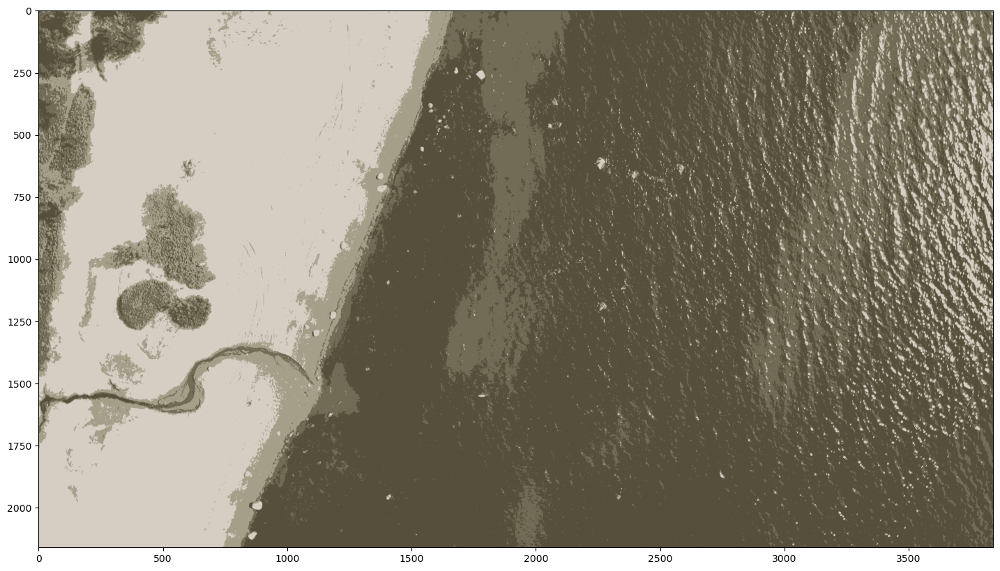

In [5]:
# отображаем с помощью pyplot

import matplotlib.pyplot as plt

plt.figure(figsize=(30,10))
plt.imshow(segmented_im/256)

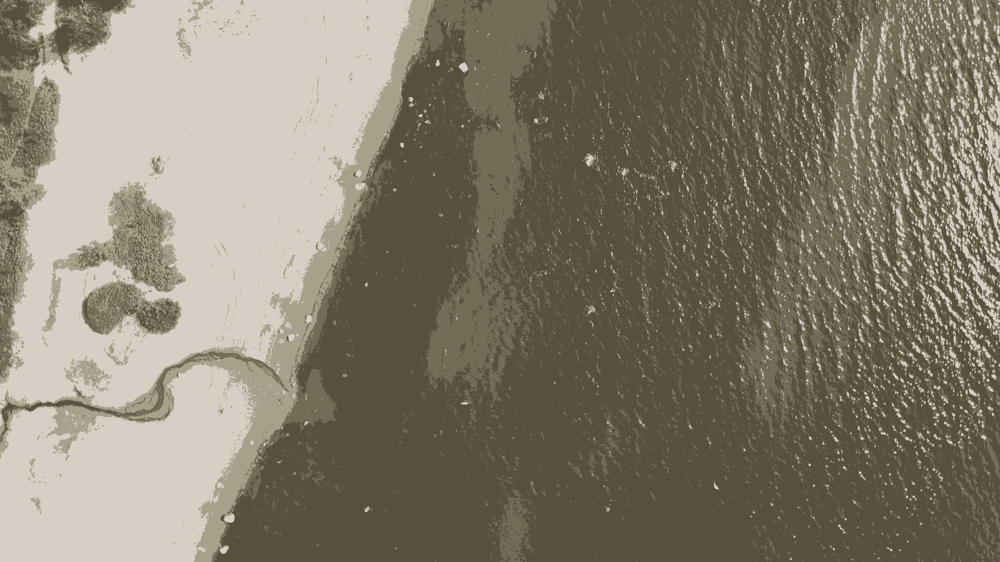

In [6]:
# Рисуем картинку на основе значений numpy массива segmented_im

image_new = Image.new('RGB', (width,height))  # создаём новый рисунок и инструмент для рисования
draw_new = ImageDraw.Draw(image_new)

for i in range(width):
    for j in range(height):
        draw_new.point((i,j), tuple(int(round(t)) for t in tuple(segmented_im[j,i])))  # закрашиваем пиксели

image_new

In [7]:
# сохраняем полученное изображение в файл

image_new_path = os.path.join(parent_dir, 'images','for_02_image_processing_notebook','segmented_beach.jpg')
image_new.save(image_new_path)

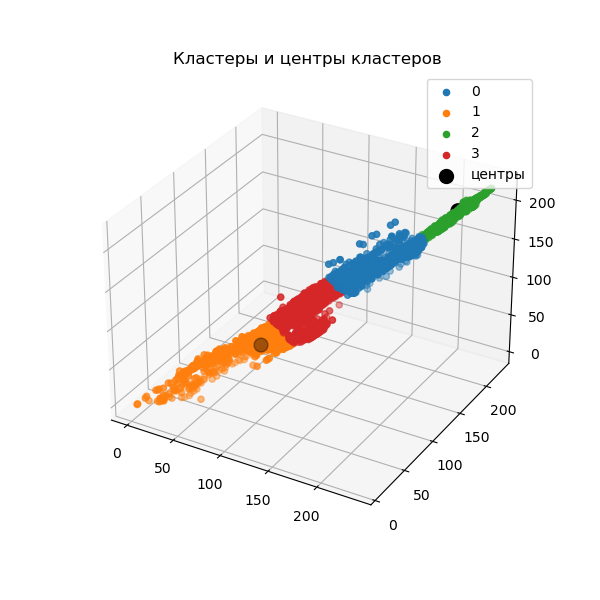

In [8]:
# визуализируем кластеры и их центры

%matplotlib widget

labels = np.unique(kmeans.labels_)

fig = plt.figure(figsize=(6,6))
#fig = plt.figure("Кластеры", figsize=(6,6))
#fig.suptitle('Кластеры')
ax = fig.add_subplot(projection='3d')

for i in labels:
    red = X[kmeans.labels_==i, 0]
    green = X[kmeans.labels_==i, 1]
    blue = X[kmeans.labels_==i, 2]
    ax.scatter(red[0:1000], green[0:1000], blue[0:1000], label=i)
ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], kmeans.cluster_centers_[:,2], s=100, color='black', label='центры')

plt.title('Кластеры и центры кластеров')
plt.legend()
plt.show()